In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import spacy
import itertools as it
from gensim.models import Phrases
from gensim.models.word2vec import LineSentence
from gensim.corpora import Dictionary, MmCorpus
from gensim.models.ldamulticore import LdaMulticore
import warnings
import _pickle as pickle
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, value
import matplotlib.pyplot as plt
%matplotlib inline
output_notebook()
import nltk

import seaborn as sns
from matplotlib import pyplot as plt
%config InlineBackend.figure_format = 'svg' # plots look nicer in svg
%matplotlib inline
sns.set()
pd.options.display.max_colwidth = 160

from subprocess import check_output

## Warnings
import warnings
from scipy import stats
warnings.filterwarnings('ignore')

Loading BokehJS ...

In [2]:
df=pd.read_csv('data_capstone_2/nlp_reviews_cleaned.csv', delimiter=',')

# Exploring Features
    
    * Rating (target variable)
    * Customer (who made reviews)
    * Product (which was reviewed)
    * Time (datetime of reviews)
    * Postive feedback
    * Negative feedback
    * Review Length
    * Review Text

# 1. "Rating" feature

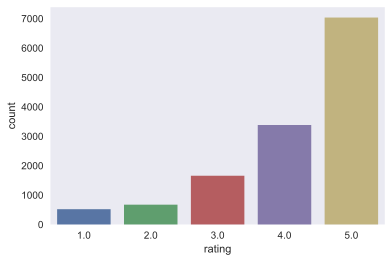

In [52]:
sns.countplot(x=df['rating'])

Text(0.5,1,'Rating Distribution')

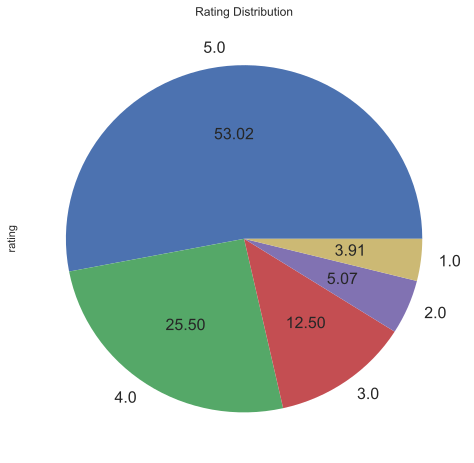

In [50]:
df['rating'].value_counts().plot.pie(autopct='%.2f', fontsize=16, figsize=(8, 8))
plt.title('Rating Distribution')

### Comment:
    * There is an imbalance between rating classes
    * Especially 1 and 2 ratings have small portions according to other classes

# 1. "Customer" feature

## How many different customers gave review?

In [123]:
print('Number of unique customers: {}'.format(len(df.customer.unique())))

Number of unique customers: 1686


## Customers and number of reviews

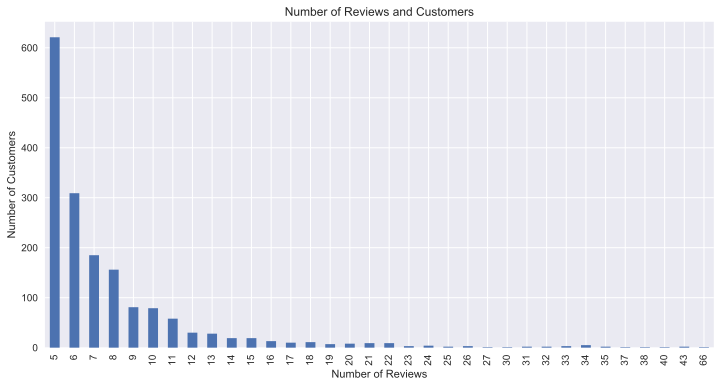

In [94]:

plt.figure(figsize = (12,6))
df_dep = (df['customer'].value_counts()).value_counts().sort_index()
df_dep.plot.bar()
plt.xlabel('Number of Reviews')
plt.ylabel('Number of Customers')
plt.title('Number of Reviews and Customers')
plt.show()

### Comment:

    * Most of the customers gave less than 8 reviews (mean = 7.87)
    * Giving more than 20 reviews is very rare
    * They are rare but we have customers who made reviews more than 40
    * Customers who has a large number of reviews may effect the objectiveness of the results

## Outlier customers (in regards of number of reviews)


Review per customer: 7.871886120996441


Text(0.5,1,'Reviews made by a single custoomer Outliers')

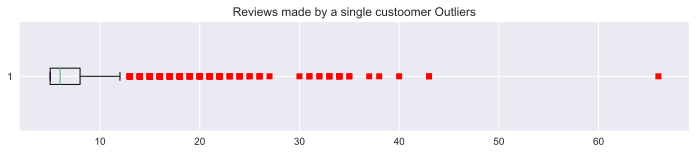

In [135]:
# detecting outliers of customers who made many reviews.
print('\nReview per customer: {}'.format((len(df)/len(df['customer'].unique()))))
a = np.array(df.customer.value_counts())
fig = plt.figure(figsize=(12,2))
plt.boxplot(a, 0, 'rs', 0)
plt.title('Reviews made by a single custoomer Outliers')

### Comment:
    * There are outlier customers in regards of number of reviews.
    * This may effect the objectiveness of the rating class. 
    * So, they may effect the score of the model.  

## How many different customers we have in each rating class?
## (What is the customer uniqueness of each "rating class"?)

In [228]:
a = list(df.groupby(['rating'])['customer'].unique())    # unique customers for each "rating class"
a2 = [len(a[0]),len(a[1]),len(a[2]),len(a[3]),len(a[4])] # number of customers
b = list(df.rating.value_counts())                       # number of reviews for each "rating class"
c = [ai/bi for ai,bi in zip(a2,sorted(b))]               # customer uniqueness of each "ranting class"

df3= pd.DataFrame({'rating_class': [1,2,3,4,5],
                   'number_of_reviews': sorted(b),
                   'number_of_customers': a2,
                   'customer_uniqueness': ["%.2f" % e for e in c]})

print(df3)

   rating_class  number_of_reviews  number_of_customers customer_uniqueness
0             1                519                  381                0.73
1             2                673                  484                0.72
2             3               1659                  883                0.53
3             4               3384                 1234                0.36
4             5               7037                 1599                0.23


### Comment:

    * Here, "customer uniqueness" computed as a metric of "rating class"
    * The purpose is undertsanding "how much are the reviews made by different customers 
      or how much are they populated by same customers.
    * For instance, customer uniquness of "rating class 5" is 0.23, this means 77% of the reviews are given by customers who already made a review before
    * And some customers are populating the review rates which may effect the test scores negatively.
    * So what;
            For a detailed work, this small nuances can make difference and it may be requried to handle them.

## Customers and Review Length

In [7]:
def lenght(text):
    lenght = len([w for w in nltk.word_tokenize(text)])
    return lenght

df['review_length'] = df['review_text'].apply(lenght)

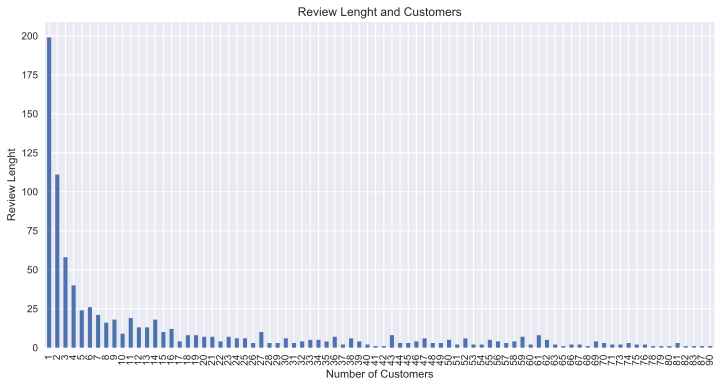

In [33]:
plt.figure(figsize = (12,6))
df_dep = (df['review_length'].value_counts()).value_counts().sort_index()
df_dep.plot.bar()
plt.xlabel('Number of Customers')
plt.ylabel('Review Lenght')
plt.title('Review Lenght and Customers')
plt.show()

### Comment:
    * Most of the customers are tend to make short reviews

# 2. "Product" Feature

## Number of unique products

In [256]:
print('Number of unique PRODUCTS: {}'.format(len(df['product'].unique())))

Number of unique PRODUCTS: 962


## Products and number of reviews

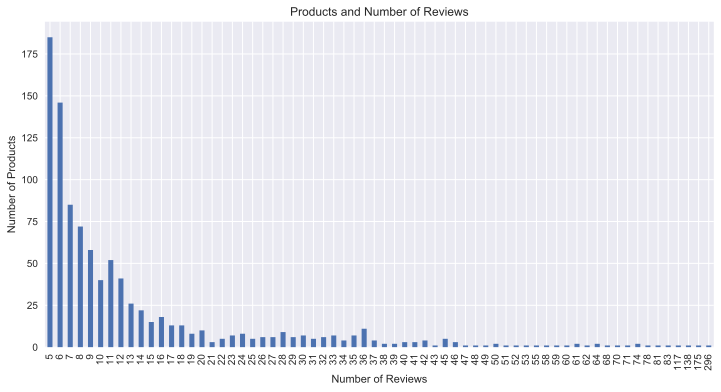

In [257]:
plt.figure(figsize = (12,6))
df_pro = (df['product'].value_counts()).value_counts().sort_index()
df_pro.plot.bar()
plt.xlabel('Number of Reviews')
plt.ylabel('Number of Products')
plt.title('Products and Number of Reviews')
plt.show()

### Comment:
    * Most of the products have less than 14 reviews (mean = 13.79)
    * Product which have been received more than mean can analysis differently for extracting the strong issues about the products. For instance, cronical problems can be easliy detected in this way.

## Outlier products (in regards of number of reviews)


Review per product: 13.796257796257796


Text(0.5,1,'Reviews made for a single product')

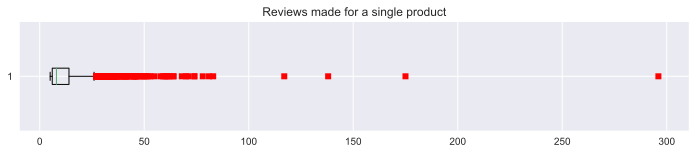

In [259]:
# detecting outliers of products which have been reviews more than normal.
print('\nReview per product: {}'.format((len(df)/len(df['product'].unique()))))
a = np.array(df['product'].value_counts())
fig = plt.figure(figsize=(12,2))
plt.boxplot(a, 0, 'rs', 0)
plt.title('Reviews made for a single product')

### Comment:
    * There are outlier products.
    * These outlier can be considered in two different aspects
        - The first one, most probably, reviews which are made for a single product share the same or similar words, and this fact may effect the test score.
        - The second one, reviews of outlier products may give clues about the strong and weak points of the related products.

# 3. 'Feedback' Features

## Positve feedbacks and ratings

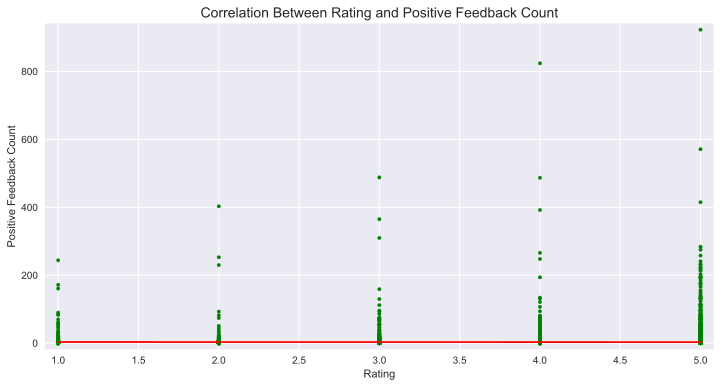

In [351]:
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df['rating'], df['pos_feedback'], color = 'green', marker = '.', norm = True)

xm, ym = np.polyfit(df['rating'], df['pos_feedback'], 1)
# Make theoretical line to plot
x = np.array([1,5])
y_m = xm * x + ym
# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Positive Feedback Count')
_ = plt.xlabel('Rating')
_ = plt.title('Correlation Between Rating and Positive Feedback Count', size = 14)
plt.margins(0.02)

### Comment: 
    The correlation between postive feedback and rating is very small and it is neglectable

## Outlier positive feedbacks (in regards of number of feedbacks)

Text(0.5,1,'Posive Feedback Outliers')

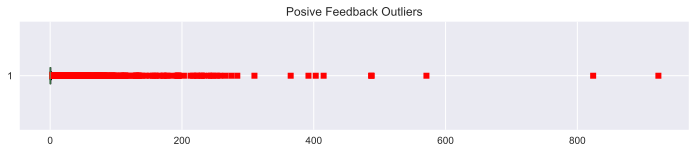

In [352]:
# visualizing postive_feedback ouliers
fig = plt.figure(figsize=(12,2))
plt.boxplot(df['pos_feedback'], 0, 'rs', 0)
plt.title('Posive Feedback Outliers')

### Comment:
    * Postive feedback outliers can provide the information of what customers like most about a specific product, and company can use this information for further improvements of the related products. 

## Negative feedbacks and ratings

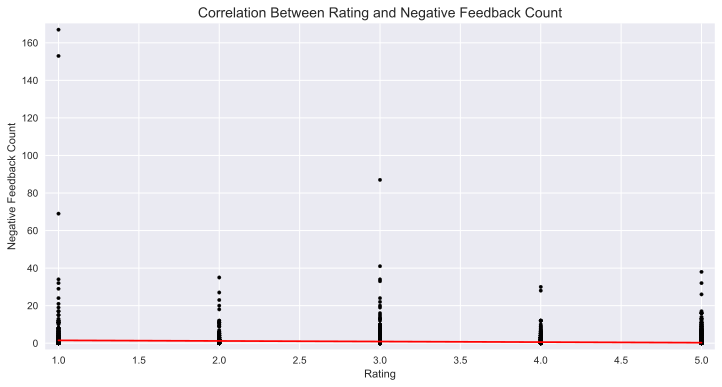

In [350]:
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df['rating'], df['neg_feedback'], color = 'black', marker = '.', norm = True)

xm, ym = np.polyfit(df['rating'], df['neg_feedback'], 1)
# Make theoretical line to plot
x = np.array([1,5])
y_m = xm * x + ym
# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Negative Feedback Count')
_ = plt.xlabel('Rating')
_ = plt.title('Correlation Between Rating and Negative Feedback Count', size = 14)
plt.margins(0.02)

### Comment:
    * There is a negative corelation between negative feedback and rating variables but it is not strong.

## Outlier negative feedbacks (in regards of number of feedbacks)

Text(0.5,1,'Negative Feedback Outliers')

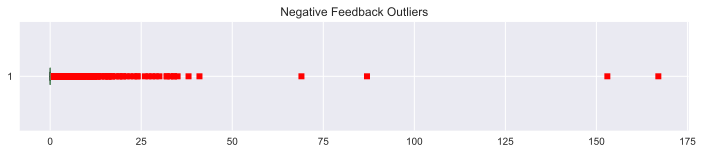

In [5]:
# visualizing postive_feedback ouliers
fig = plt.figure(figsize=(12,2))
plt.boxplot(df['neg_feedback'], 0, 'rs', 0)
plt.title('Negative Feedback Outliers')

### Comment:
    * Postive feedback outliers can provide the information of what customers like most about a specific product, and company can use this information for further improvements of the related products. 

# 4. "Review Length" feature

## Review Length and Rating Classes

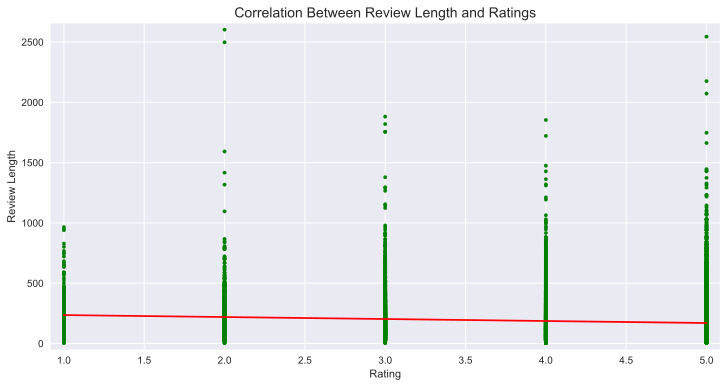

In [8]:
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df['rating'], df['review_length'], color = 'green', marker = '.', norm = True)

xm, ym = np.polyfit(df['rating'], df['review_length'], 1)
# Make theoretical line to plot
x = np.array([1,5])
y_m = xm * x + ym
# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Review Length')
_ = plt.xlabel('Rating')
_ = plt.title('Correlation Between Review Length and Ratings', size = 14)
plt.margins(0.02)

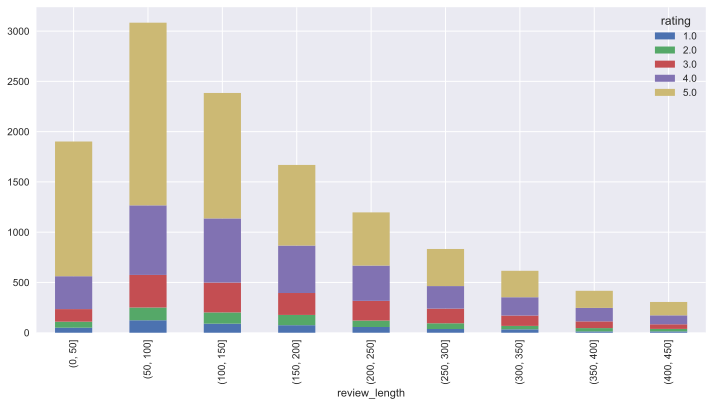

In [343]:
plt.rcParams["figure.figsize"] = (12,6)
df.groupby(['rating', pd.cut(df['review_length'], np.arange(0,500,50))])\
       .size()\
       .unstack(0)\
       .plot.bar(stacked=True)

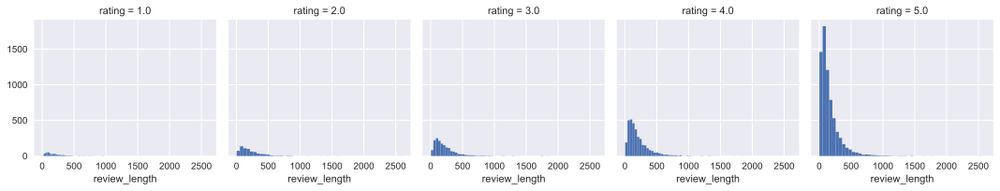

In [16]:
g = sns.FacetGrid(data=df, col='rating')
g.map(plt.hist, 'review_length', bins=50)

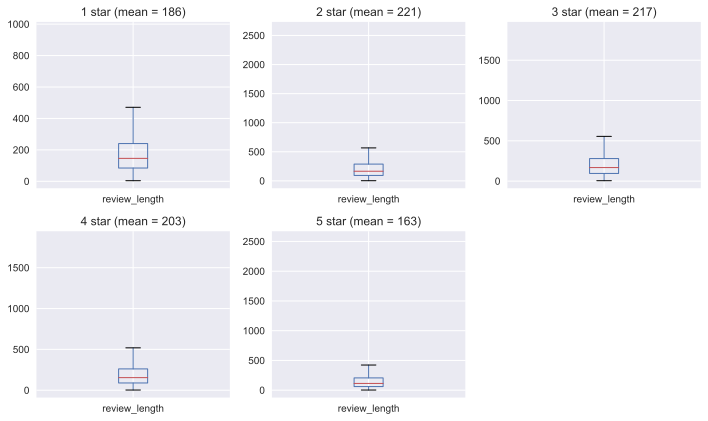

Correlation between stars and length of review text is not obvious.


In [28]:
# Average review length based on the star rating
star_review_lengths = { star: df.review_length[df.rating == star] for star in range(1,6) }

plt.figure(figsize=(10,6))

for star in range(1,6):
    plt.subplot(2,3,star)
    star_review_lengths[star].plot(kind='box')
    average_length = str( int( round( np.mean(star_review_lengths[star]) , 0) ) )
    plt.title( str(star) + ' star (mean = '+ average_length +')' )
    plt.suptitle("")
    
plt.tight_layout()    
plt.show()

print('Correlation between stars and length of review text is not obvious.')

### Comment:
    * There is a very slight negative correlation between Review Length and Rating Classes. 
    * Most of the reviewvs have less than 200 words.
    * Boxplots show us that customers tend to using more words when they give 2 , 3 and 4 ratings.

## Review Length and Feedbacks

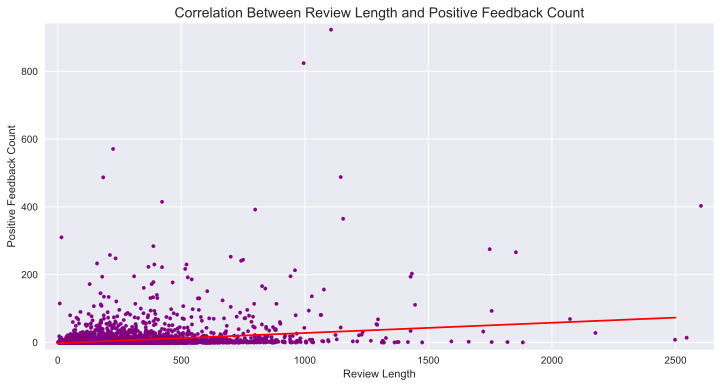

In [10]:

sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df['review_length'], df['pos_feedback'], color = 'purple', marker = '.', norm = True)

xm, ym = np.polyfit(df['review_length'], df['pos_feedback'], 1)
# Make theoretical line to plot
x = np.array([0,2500])
y_m = xm * x + ym
# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Positive Feedback Count')
_ = plt.xlabel('Review Length')
_ = plt.title('Correlation Between Review Length and Positive Feedback Count', size = 14)
plt.margins(0.02)

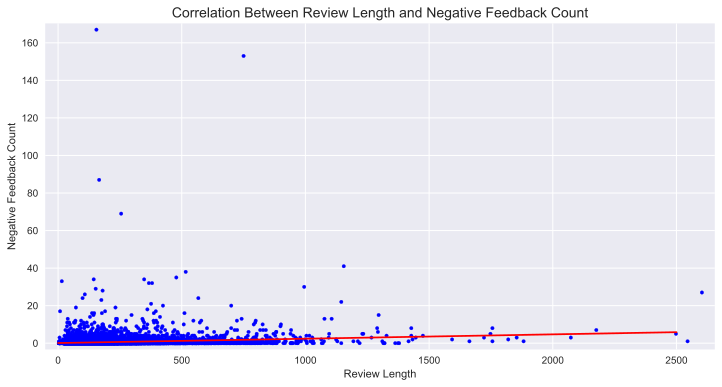

In [11]:
sns.set()
plt.figure(figsize = (12,6))
_ = plt.scatter(df['review_length'], df['neg_feedback'], color = 'blue', marker = '.', norm = True)

xm, ym = np.polyfit(df['review_length'], df['neg_feedback'], 1)
# Make theoretical line to plot
x = np.array([0,2500])
y_m = xm * x + ym
# Add regression line to your plot
_ = plt.plot(x, y_m, color='red')
_ = plt.ylabel('Negative Feedback Count')
_ = plt.xlabel('Review Length')
_ = plt.title('Correlation Between Review Length and Negative Feedback Count', size = 14)
plt.margins(0.02)

### Comment:
    * There is a positive corelation between feedbacks and review length.
    * But this relationships are not strong.

## Corelation Between Numeric Variables

<Figure size 432x288 with 0 Axes>

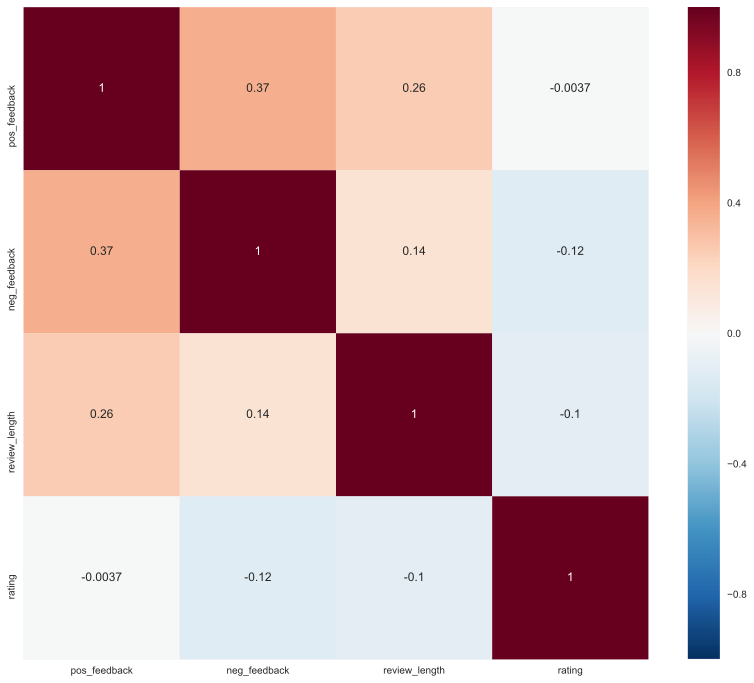

In [35]:
corr = df[['pos_feedback', 'neg_feedback', 'review_length', 'rating']].corr(method="pearson")
# display(correlation)
fig3 = plt.figure()
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(corr, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

### Comment:
    * There is no strong correlation between any two numeric variables.

# 5. "Review Text" feature

## Top 10 Words

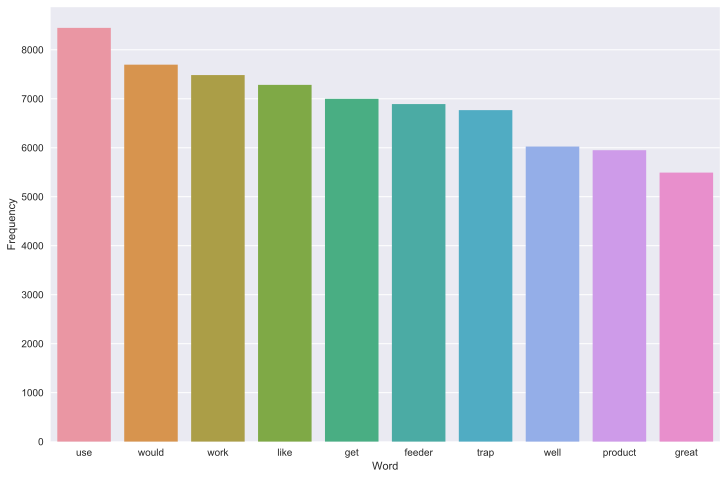

In [34]:
top_N = 100
cleaned_text = [str(txt) for text in df['clean_text'] for txt in text.split(' ') 
                if len(txt)>2 and txt not in 'not, nan, one, two, three, four, five, six, seven, eight, nine']

word_dist = nltk.FreqDist(cleaned_text)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(12,8))
sns.set()
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(10))

## Most Common words and Ratings

In [14]:
five = df.loc[df.rating == 5.0]
four = df.loc[df.rating == 4.0]
three = df.loc[df.rating == 3.0]
two = df.loc[df.rating == 2.0]
one = df.loc[df.rating == 2.0]


five_r = five.clean_text
four_r = four.clean_text
three_r = three.clean_text
two_r = two.clean_text
one_r = one.clean_text

In [17]:
fd = nltk.FreqDist([y for x in df.clean_text.str.split() for y in x])

fd_five = nltk.FreqDist([y for x in five_r.str.split() for y in x])
fd_four = nltk.FreqDist([y for x in four_r.str.split() for y in x])
fd_three = nltk.FreqDist([y for x in three_r.str.split() for y in x])
fd_two = nltk.FreqDist([y for x in two_r.str.split() for y in x])
fd_one = nltk.FreqDist([y for x in one_r.str.split() for y in x])

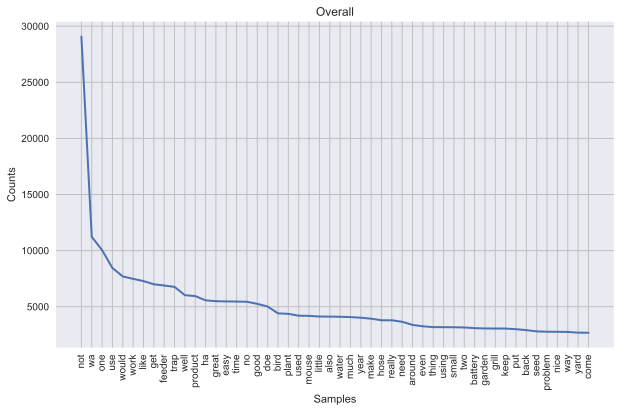

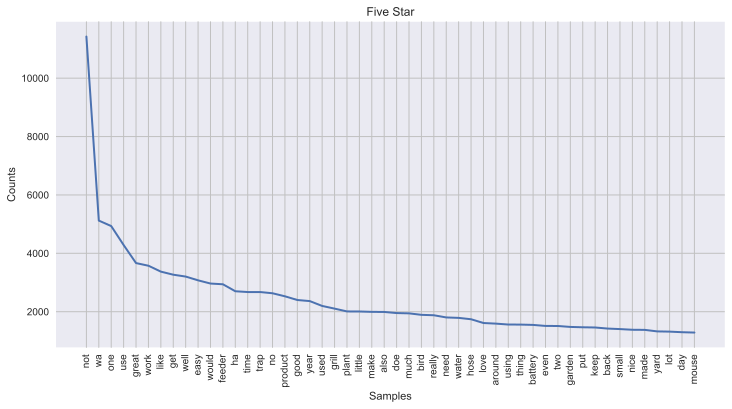

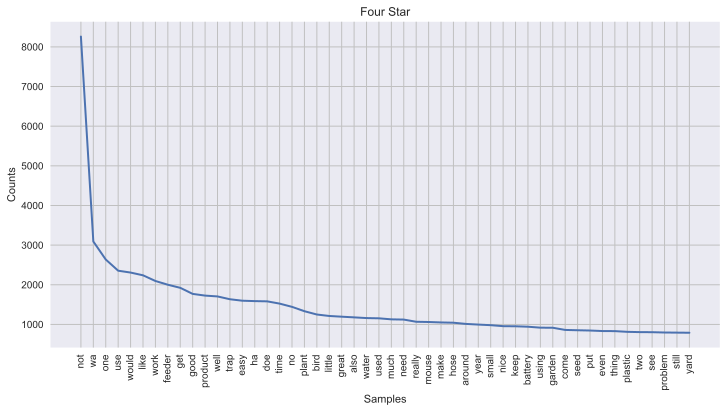

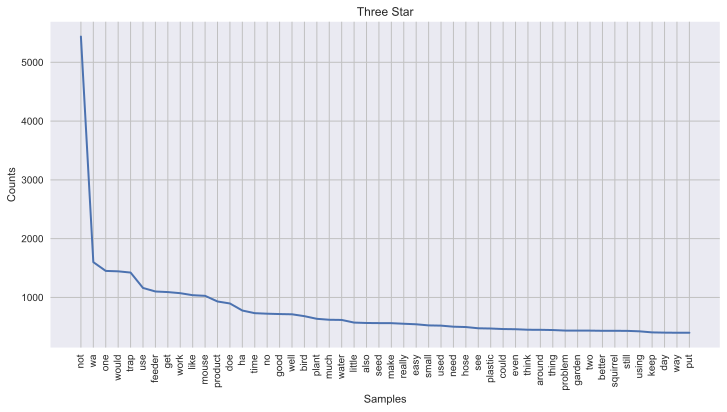

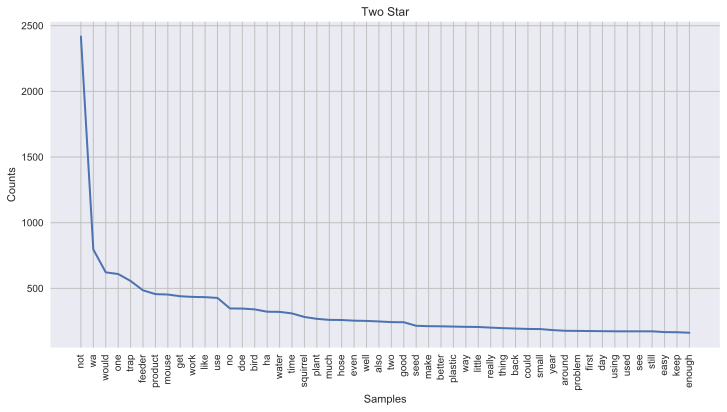

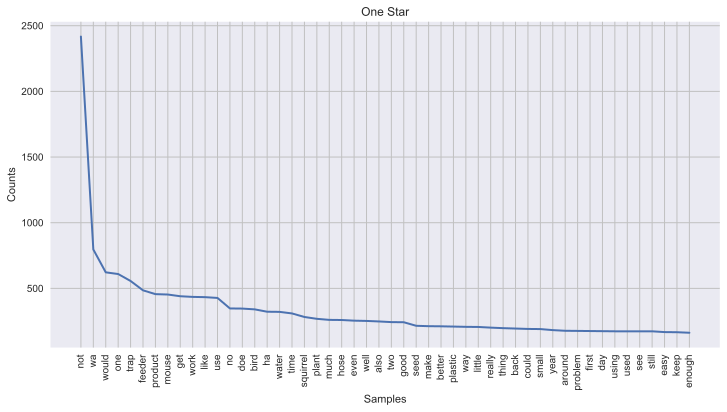

In [118]:
plt.figure(figsize = (10,6))
fd.plot(50, title='Overall')
fd_five.plot(50, title='Five Star')
fd_four.plot(50, title='Four Star')
fd_three.plot(50, title='Three Star')
fd_two.plot(50, title='Two Star')
fd_one.plot(50, title='One Star')

### Comment:
    * Most significant infrence of text graphs is that there is a great number of matching words among review texts of different rating classes

## Word Clouds

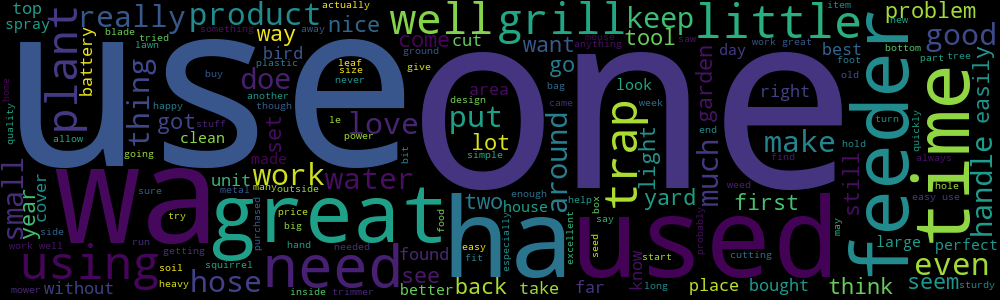

In [36]:
from wordcloud import WordCloud
sns.set_style({'axes.grid' : False})

WordCloud(min_font_size=8, width=1000, height=300).generate(' '.join(five_r)).to_image()

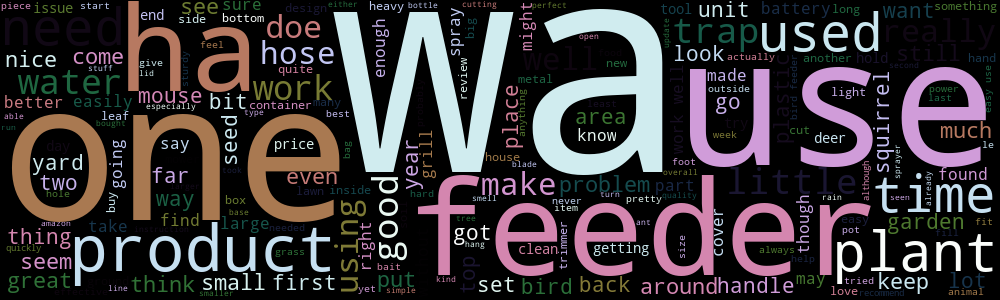

In [37]:
WordCloud(min_font_size=8, width=1000, height=300, colormap='cubehelix_r').generate(' '.join(four_r)).to_image()

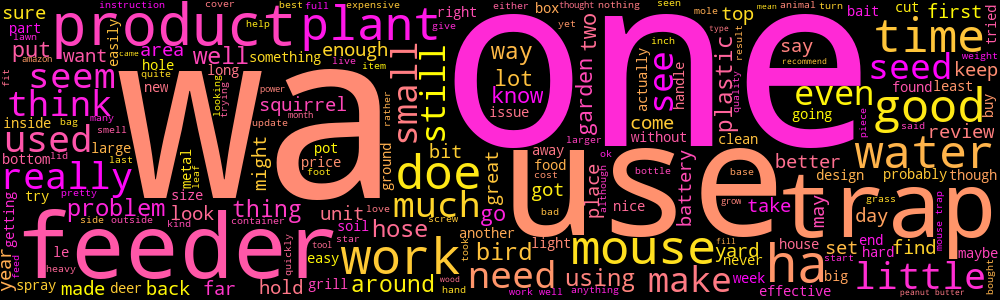

In [38]:
WordCloud(min_font_size=8, width=1000, height=300, colormap='spring').generate(' '.join(three_r)).to_image()

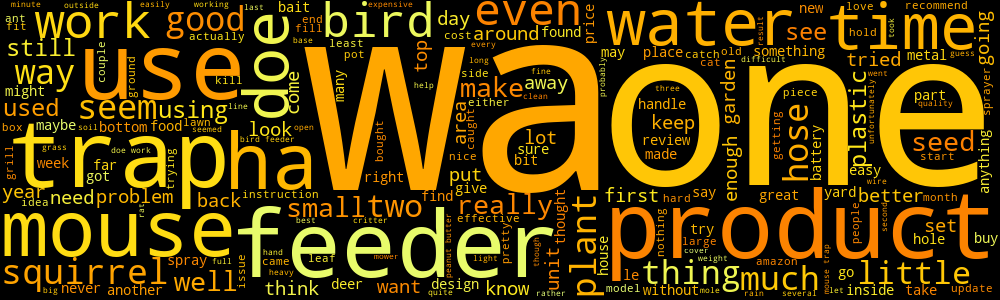

In [39]:
WordCloud(min_font_size=8, width=1000, height=300, colormap='Wistia').generate(' '.join(two_r)).to_image()

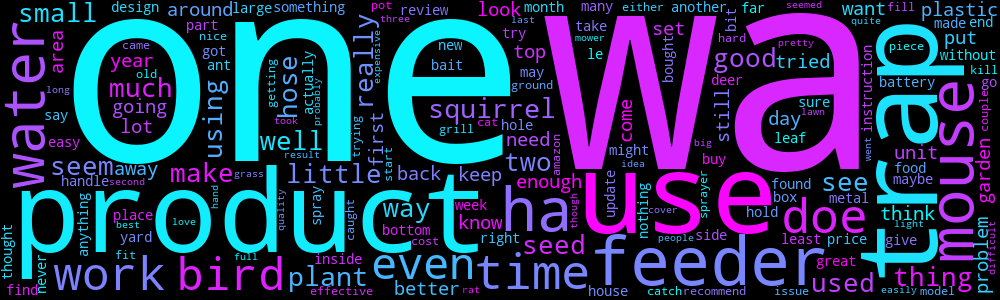

In [40]:
WordCloud(min_font_size=8, width=1000, height=300, colormap='cool').generate(' '.join(one_r)).to_image()

# EDA Findings:

    * There is an imbalance between rating classes, especially 1 and 2 ratings have small portions according to other classes.
    
    * Most of the customers gave less than 8 reviews (mean = 7.87) but there are also oulier customers who have a large number of reviews. A great number of reviews which are made by a single customer may effect the objectiveness and so the test score negatively.
    
    * Customer uniquness of 4 and 5 ratings are low, it means they are populated by same customers. This may bring the same above drawbacks.
    
    * Most of the products have less than 14 reviews (mean = 13.79). Product which have been received more than mean can be analysed differently for extracting the strong issues about the products. For instance, cronical problems can be easliy detected in this way.
    
    * There is a negative corelations between number of feedbacks and rating classes are not strong. But outlier feedbacks can provide additional information.
    
    * Most of the reviewvs have less than 200 words. And customers tend to using more words when they give 2 , 3 and 4 ratings.
    
    * There is no strong correlation between any two numeric variables.
    
    * Most significant infrence of text graphs is that there is a great number of matching words among review texts of different rating classes
    
   ### Recap crucial points:
   
       * There is no strong relationship between numeric predictors and target variable
       
       * Data set is imbalanced in regards of rating classes.
       
       * There is a great number of matching words among rating classes.
    
   ### So What:
    
    * Using numeric variables may not be useful for prediction
    
    * We can reduce the imbalance with reducing the number of rating classes.